In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.dataset.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.roboflow.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/split.py
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00108_jpg.rf.3335d7cd1850cfa9d60d5bf7b48b5f33.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/10_00103_jpg.rf.1549154b51978d775abdb07b0bbf8ed7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/6_00054_jpg.rf.e55a6a8deba73ad5807c903e5299991d.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00088_jpg.rf.a4abd94687414d676ac4047fb693d2d7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/3_00149_jpg.rf.cf5567a5c4ca41e0ac97599663a260e9.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/11_00031_jpg.rf.fb6cad24e

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 14.4 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


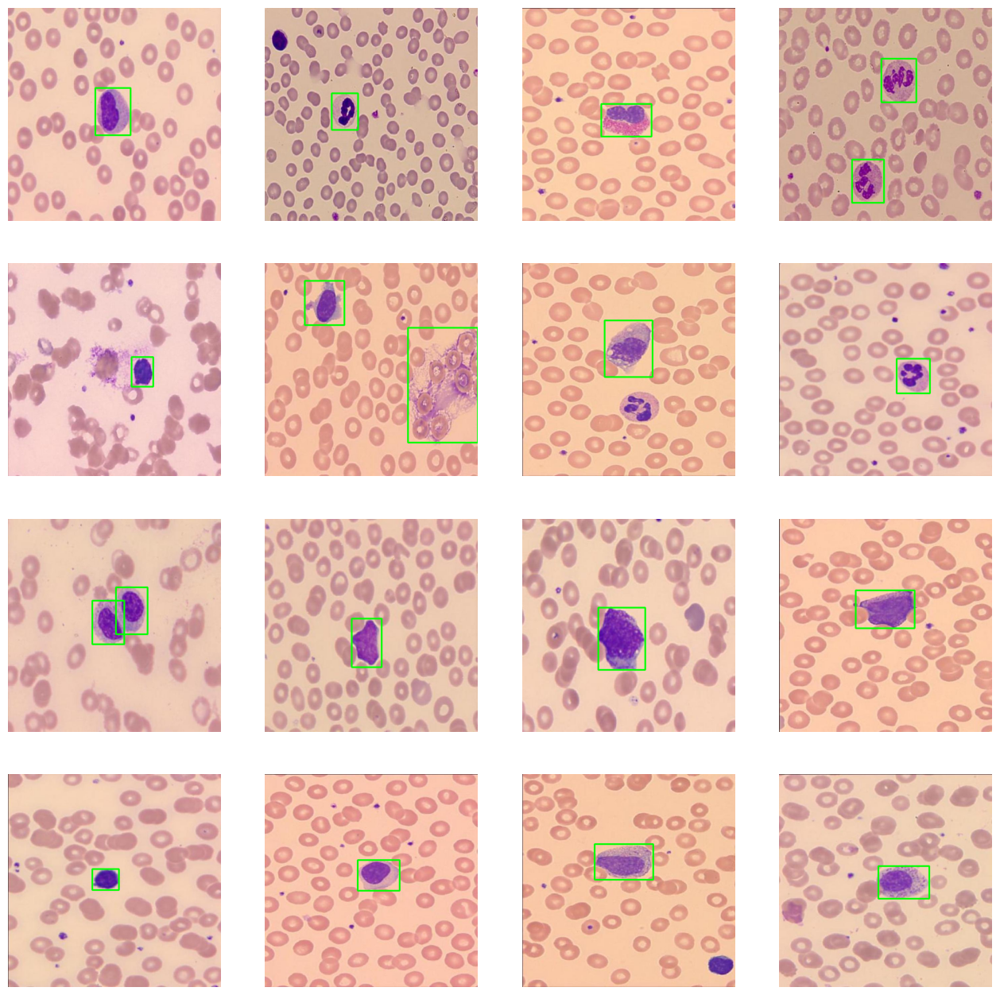

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images"
train_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels"

test_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images"
test_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels"

val_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/images"
val_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images/10_00001_jpg.rf.4fcbf927a55ca52647a1f9e5d1beb0b7.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:

from ultralytics import YOLO

# Load a pre-trained YOLOv10n model
model = YOLO("yolov10s.pt")

100%|██████████| 15.9M/15.9M [00:00<00:00, 142MB/s]


In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,                                  
    device='0'                       
)


Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 13.6MB/s]
2024-10-11 23:10:25,359	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-11 23:10:26,160	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1     36096  ultralytics.nn.modules.block.SCDown          [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1    137728  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 63.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels... 5803 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5803/5803 [00:31<00:00, 186.38it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels... 717 images, 0 backgrounds, 0 corrupt: 100%|██████████| 717/717 [00:03<00:00, 181.28it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      5.25G      1.546      9.282      2.085         16        640: 100%|██████████| 363/363 [02:09<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.68it/s]

                   all        717        809      0.396      0.607      0.451      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      5.21G      1.579      3.242       2.07         20        640: 100%|██████████| 363/363 [02:04<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.26it/s]

                   all        717        809      0.465      0.619      0.531      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      5.21G      1.629      2.939      2.117         26        640: 100%|██████████| 363/363 [02:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.416      0.412      0.372      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80       5.2G      1.592       2.74      2.093         11        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.23it/s]

                   all        717        809      0.519      0.567      0.564      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80       5.2G      1.533      2.583      2.086         20        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.23it/s]

                   all        717        809      0.588       0.65      0.628      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      5.21G      1.473      2.437      2.035         19        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]

                   all        717        809      0.622      0.687      0.694      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80       5.2G      1.466      2.275      2.031         15        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.631       0.73      0.719       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80       5.2G      1.429      2.182      2.015         18        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        717        809      0.631      0.679      0.691      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80       5.2G      1.408      2.099      2.003         23        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.26it/s]

                   all        717        809      0.636      0.766       0.74      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      5.35G      1.382      2.001      1.991         26        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        717        809      0.731      0.747       0.79      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      5.21G      1.361      1.983      1.999         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809       0.67      0.789      0.777      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80       5.2G      1.342       1.89      1.988         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        717        809      0.735      0.733      0.793      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80       5.2G      1.325       1.87      1.972         24        640: 100%|██████████| 363/363 [02:01<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]

                   all        717        809      0.712       0.73      0.784      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80       5.2G      1.327      1.832       1.98         20        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.751      0.732        0.8      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      5.19G      1.322      1.778      1.974         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809       0.76      0.791      0.832      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80       5.2G      1.308      1.751      1.974         16        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.753      0.789      0.821      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80       5.2G      1.307      1.734      1.968         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.797      0.762      0.839      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80       5.2G      1.286      1.681       1.96         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.26it/s]

                   all        717        809      0.795      0.816      0.874       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80       5.2G      1.278      1.658      1.963         26        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.786      0.802      0.869      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80       5.2G      1.271      1.608      1.949         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.798      0.794      0.861      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80       5.2G      1.267      1.589      1.953         15        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.23it/s]

                   all        717        809      0.798      0.829      0.866      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      5.36G       1.23      1.573      1.937         23        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]

                   all        717        809      0.827      0.803      0.872      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80       5.2G      1.259      1.499      1.944         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.25it/s]

                   all        717        809      0.829      0.845      0.902      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      5.19G      1.251      1.526      1.946         26        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        717        809      0.792      0.859      0.883      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80       5.2G      1.243      1.506       1.94         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.806      0.835      0.873      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      5.36G      1.235      1.451      1.929         12        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.803      0.843      0.889      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      5.19G      1.239      1.404      1.932         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.796      0.837      0.886      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80       5.2G      1.218      1.392      1.922         20        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.831      0.827      0.889      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80       5.2G      1.223      1.409      1.935         15        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.831      0.828      0.892      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80       5.2G      1.201      1.355      1.918         23        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        717        809      0.818      0.855      0.903      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      5.19G      1.208      1.336      1.927         24        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.831      0.845      0.901        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      5.19G      1.187      1.301      1.912         17        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.862      0.865      0.922      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80       5.2G      1.192      1.288      1.909         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.811      0.858        0.9      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80       5.2G      1.176      1.261        1.9         15        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.38it/s]

                   all        717        809      0.851      0.852      0.903      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80       5.2G      1.182      1.257      1.917         28        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.847      0.852      0.913      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      5.19G      1.179      1.207      1.908         20        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        717        809      0.857      0.861      0.918      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80       5.2G      1.171      1.227      1.908         18        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        717        809      0.855      0.858      0.913      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80       5.2G      1.164      1.154      1.903         19        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.857      0.863      0.924      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      5.21G      1.156      1.178      1.906         15        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.857      0.882       0.93      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80       5.2G      1.163      1.131      1.908         22        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.879      0.879      0.934      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80       5.2G      1.149      1.125      1.896         28        640: 100%|██████████| 363/363 [02:00<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        717        809      0.883      0.881      0.943      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80       5.2G      1.153      1.117      1.896         24        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.871      0.905       0.94      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      5.19G      1.137      1.086      1.888         20        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.26it/s]

                   all        717        809      0.889      0.894      0.946      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      5.21G      1.127      1.058      1.886         17        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]

                   all        717        809      0.877      0.877      0.939      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      5.21G       1.14      1.049      1.899         14        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.40it/s]

                   all        717        809      0.886      0.899      0.947      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      5.36G      1.122       1.02      1.886         25        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.922      0.876      0.949      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      5.19G      1.117      1.004      1.879         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        717        809      0.922      0.892      0.952      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      5.19G      1.119      1.004      1.883         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809       0.91      0.909      0.956      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80       5.2G      1.125     0.9941      1.893         15        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.869      0.925      0.951      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      5.36G      1.111     0.9815      1.879         20        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.905      0.907      0.955      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80       5.2G      1.108     0.9766      1.879         22        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]

                   all        717        809       0.91      0.892      0.957      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      5.19G        1.1     0.9171      1.881         27        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.915        0.9      0.962      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80       5.2G      1.088     0.9071      1.875         24        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.911      0.905      0.957       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      5.36G      1.094     0.8928      1.874         19        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.905      0.902      0.956      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      5.19G      1.091     0.8936      1.876         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        717        809      0.928      0.898      0.959      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      5.19G      1.084     0.8808      1.867         17        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.931      0.917      0.965      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80       5.2G      1.078     0.8646      1.867         19        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.922      0.932      0.961      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80       5.2G      1.053     0.8488      1.864         23        640: 100%|██████████| 363/363 [02:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.927      0.924      0.965      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80       5.2G      1.072     0.8495       1.86         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.935      0.916      0.967       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80       5.2G      1.042     0.8034       1.85         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.929       0.92      0.968      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      5.21G      1.048     0.8355      1.849         28        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.912      0.917      0.964      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80       5.2G      1.048     0.8031      1.855         15        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]

                   all        717        809      0.937      0.924      0.969      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80       5.2G      1.041     0.7904      1.846         14        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.27it/s]

                   all        717        809      0.925      0.939      0.972      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      5.19G      1.041     0.7617      1.848         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.927      0.946      0.974      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80       5.2G      1.028     0.7618      1.842         23        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.29it/s]

                   all        717        809      0.943      0.921      0.972      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      5.19G      1.031     0.7549      1.853         24        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.929      0.944      0.972      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80       5.2G      1.015     0.7355      1.844         21        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.33it/s]

                   all        717        809      0.928      0.939      0.969      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80       5.2G      1.013     0.7215      1.847         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.934      0.944      0.971       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80       5.2G      1.012     0.7246      1.832         23        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]

                   all        717        809      0.953      0.919      0.975      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80       5.2G      1.007     0.7141      1.837         22        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.945      0.929      0.975      0.893


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      5.18G     0.8681     0.4995      1.762         13        640: 100%|██████████| 363/363 [02:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]

                   all        717        809      0.946      0.933      0.972      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      5.19G     0.8496     0.4627      1.744         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.941      0.932      0.972      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      5.18G     0.8476     0.4293      1.753         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]

                   all        717        809      0.946       0.94      0.974      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      5.34G     0.8349     0.4303      1.745         13        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.30it/s]

                   all        717        809      0.932      0.956      0.974      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      5.18G     0.8301      0.425      1.742         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.34it/s]

                   all        717        809      0.953      0.938      0.974      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      5.21G     0.8256     0.4138      1.737         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.959      0.934      0.976      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      5.19G     0.8158      0.405      1.728         13        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        717        809      0.942       0.95      0.975      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      5.34G      0.811     0.3923      1.733         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.35it/s]

                   all        717        809      0.949      0.942      0.975      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      5.18G     0.8108     0.3974       1.73         11        640: 100%|██████████| 363/363 [02:00<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.38it/s]

                   all        717        809       0.94      0.949      0.976      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80       5.2G     0.8021     0.3765      1.727         12        640: 100%|██████████| 363/363 [02:00<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]

                   all        717        809      0.949      0.946      0.976      0.899



80 epochs completed in 2.889 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 16.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 16.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 293 layers, 8,044,248 parameters, 0 gradients, 24.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.20it/s]


                   all        717        809      0.939      0.949      0.976        0.9
   Atypical lymphocyte         62         72      0.954      0.856      0.951      0.849
       Band Neutrophil         63         73      0.883      0.959      0.958       0.88
              Basophil         72         73       0.99          1      0.995       0.91
                 Blast         28         63      0.998      0.937      0.985      0.923
            Eosinophil         58         59      0.966      0.983      0.989       0.91
            Lymphocyte         68         69      0.902      0.913       0.98      0.884
         Metamyelocyte         67         68      0.973      0.882      0.976       0.92
              Monocyte         55         57      0.933          1      0.975      0.924
             Myelocyte         56         62      0.842      0.919      0.948      0.843
                   NRC         53         58      0.943      0.983      0.992      0.936
          Promyelocyt

lr/pg0,▃███▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁
lr/pg1,▃▆████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▁▁▁
lr/pg2,▃▆████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▁▁▁
metrics/mAP50(B),▁▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████████████████
metrics/mAP50-95(B),▃▁▃▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████████████
metrics/precision(B),▁▁▃▄▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇██▇▇▇██████████████
metrics/recall(B),▄▄▁▅▅▆▅▅▆▆▆▆▇▇▆▇▇▇▇▇▇▇█▇▇▇▇█████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x780c6d8e4640>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

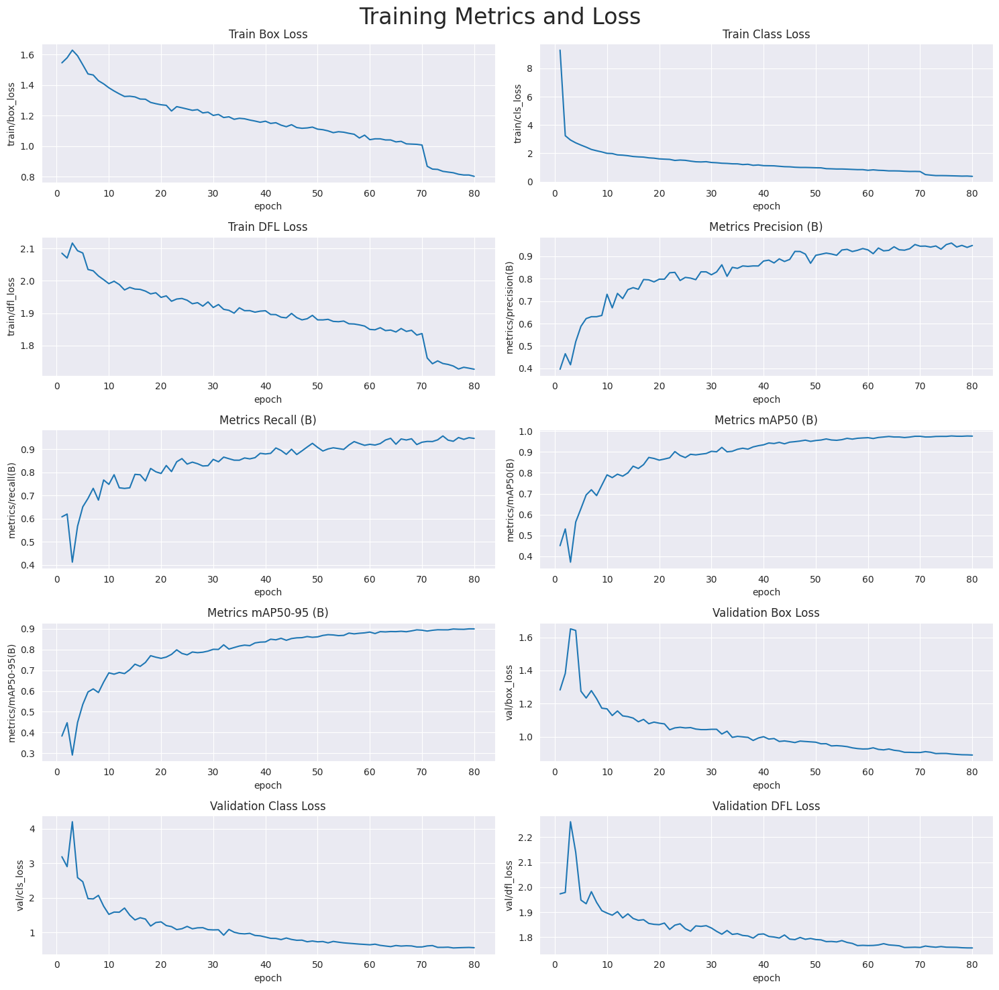

In [8]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [9]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 293 layers, 8,044,248 parameters, 0 gradients, 24.5 GFLOPs


val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels... 667 images, 0 backgrounds, 0 corrupt: 100%|██████████| 667/667 [00:04<00:00, 159.26it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:09<00:00,  4.33it/s]


                   all        667        817      0.802      0.809      0.834      0.756
   Atypical lymphocyte         98        105      0.963      0.733      0.859       0.74
       Band Neutrophil         80         99      0.847      0.727      0.816       0.76
              Basophil         90         99      0.978      0.879      0.938      0.851
                 Blast         54        121      0.964      0.893      0.941       0.87
         Metamyelocyte         86         87       0.77       0.77      0.791      0.739
             Myelocyte         82        100      0.691       0.67      0.688      0.591
                   NRC         87         91      0.838      0.912      0.926       0.81
          Promyelocyte         73         92      0.786      0.957      0.935      0.872
  Segmented neutrophil         20         23      0.378      0.739      0.613      0.575
Speed: 0.2ms preprocess, 10.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detec

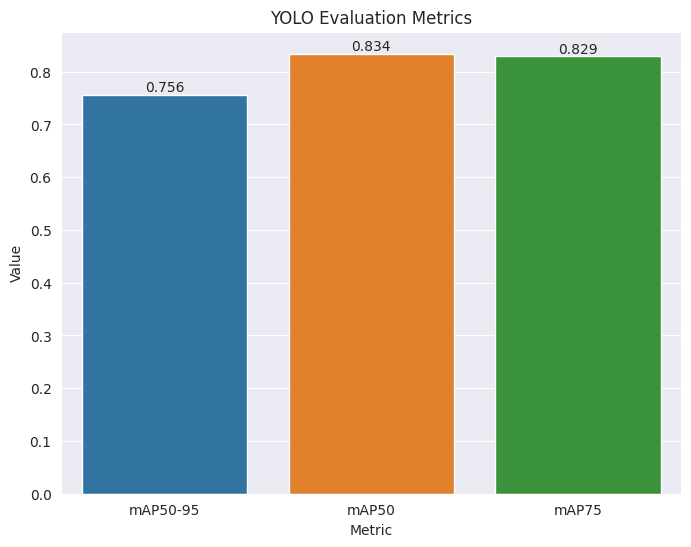

In [10]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

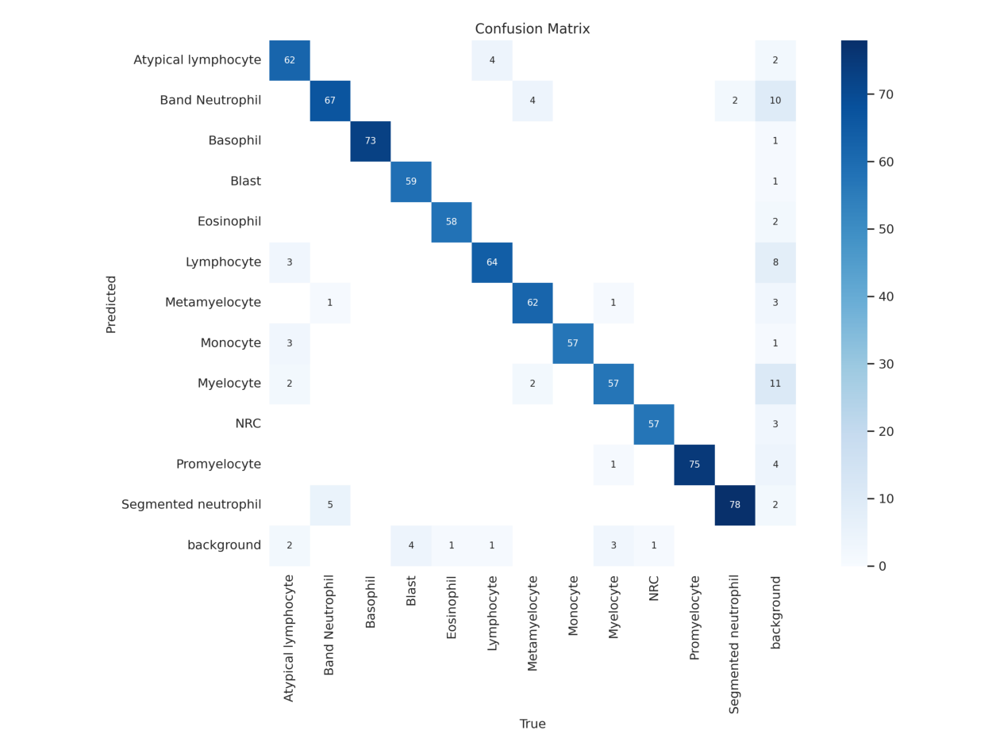

In [11]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

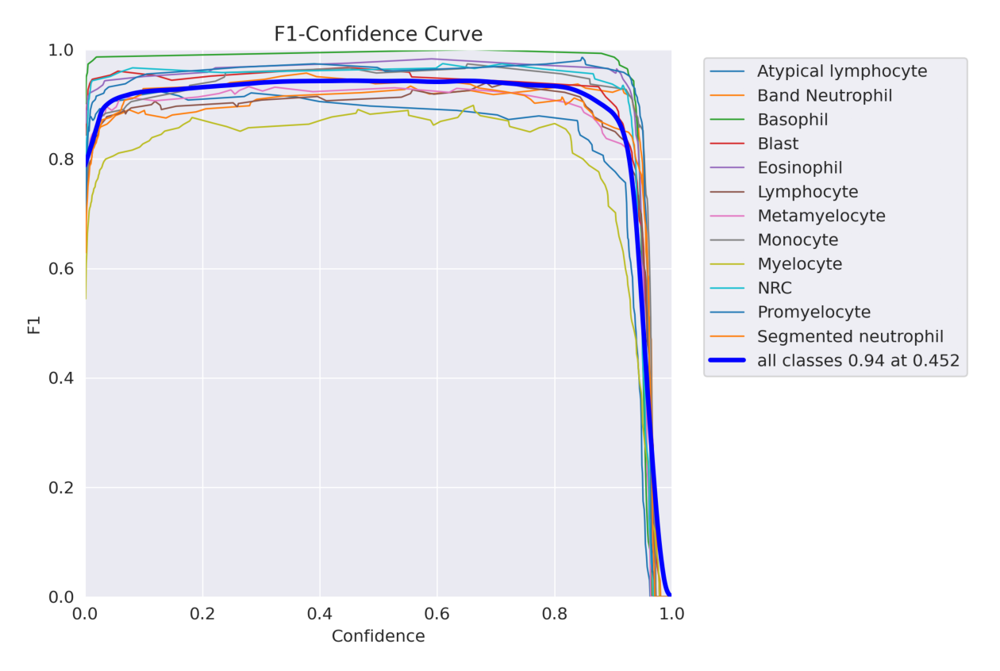

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

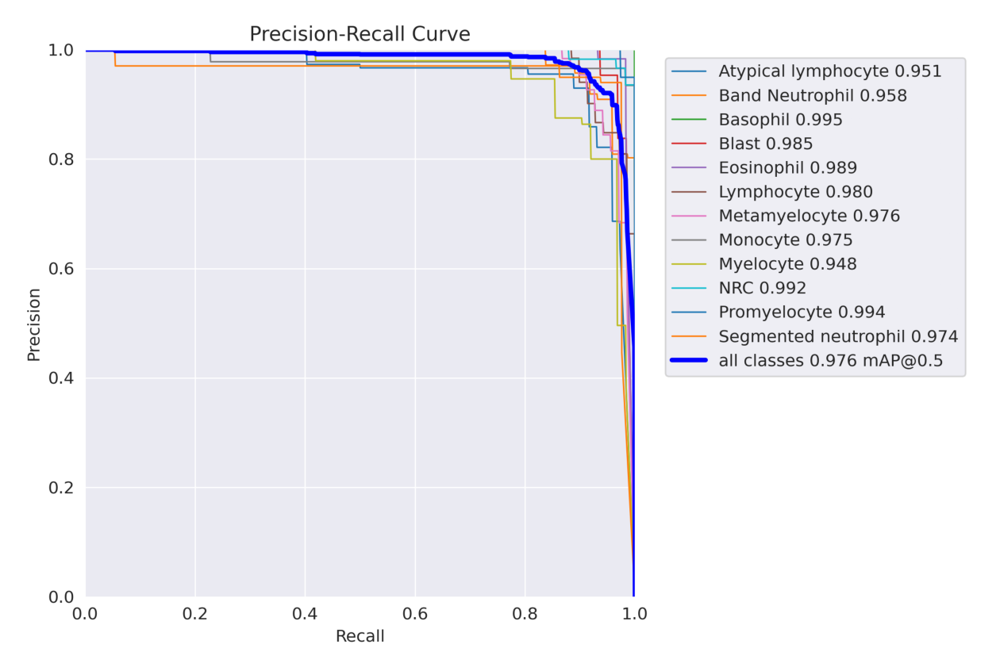

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

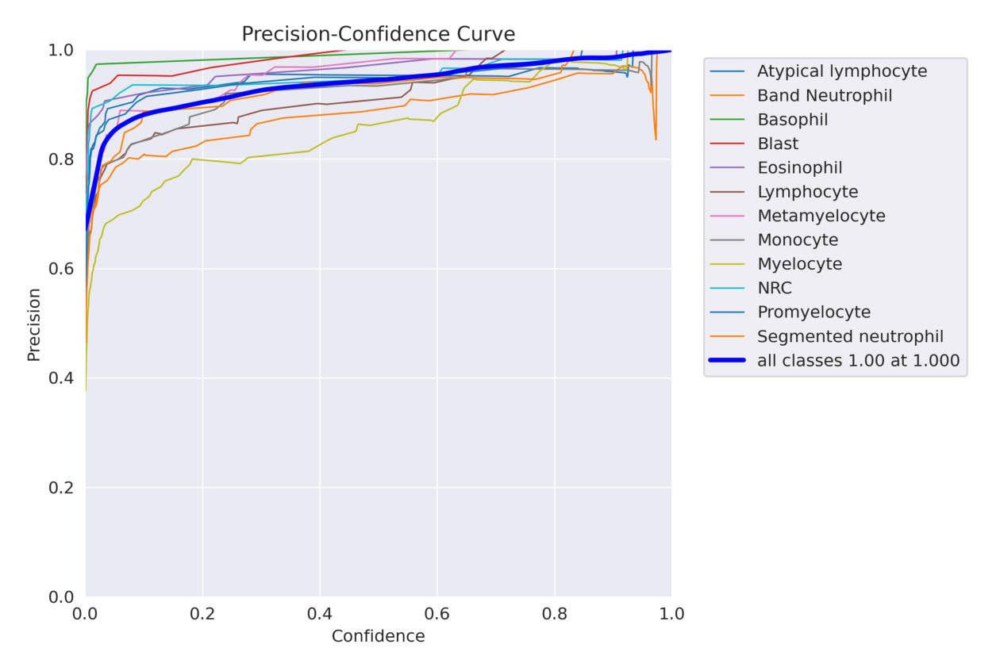

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/P_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

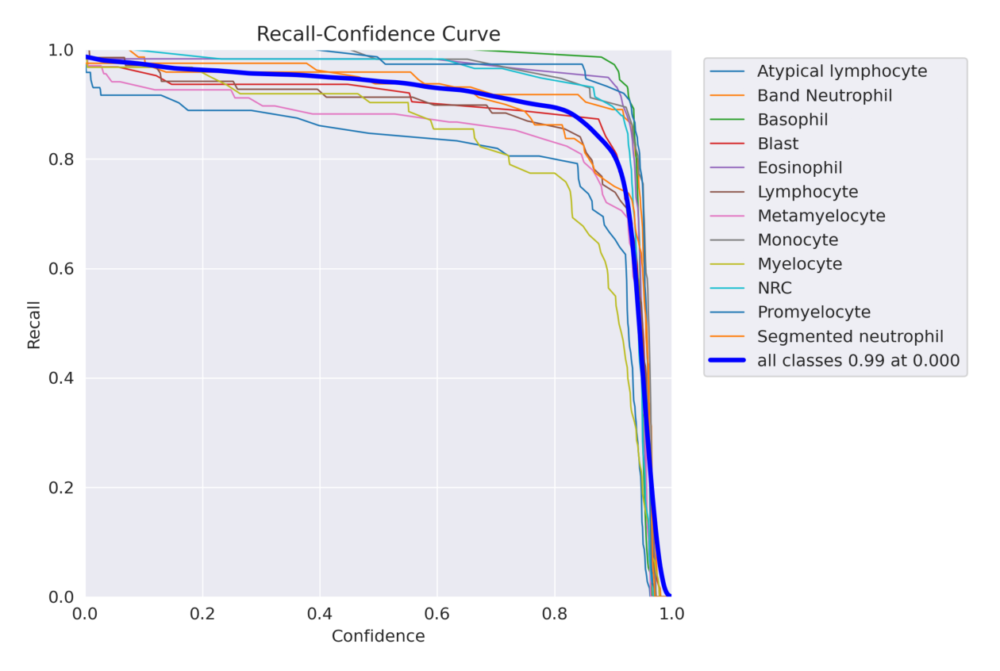

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/R_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

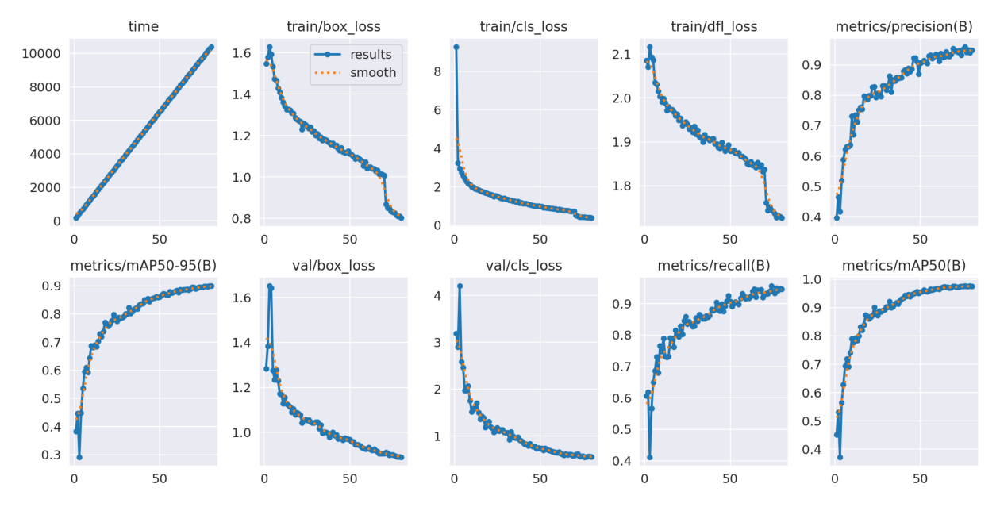

In [16]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/results.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [17]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Atypical lymphocyte, 17.6ms
Speed: 2.9ms preprocess, 17.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Promyelocyte, 17.6ms
Speed: 2.6ms preprocess, 17.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NRC, 17.5ms
Speed: 1.9ms preprocess, 17.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 17.5ms
Speed: 2.3ms preprocess, 17.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 17.5ms
Speed: 3.0ms preprocess, 17.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Myelocyte, 17.5ms
Speed: 2.9ms preprocess, 17.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 17.4ms
Speed: 1.7ms preprocess, 17.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 17.5ms
Speed: 3.7ms preprocess, 17.5ms inference, 0.5ms pos

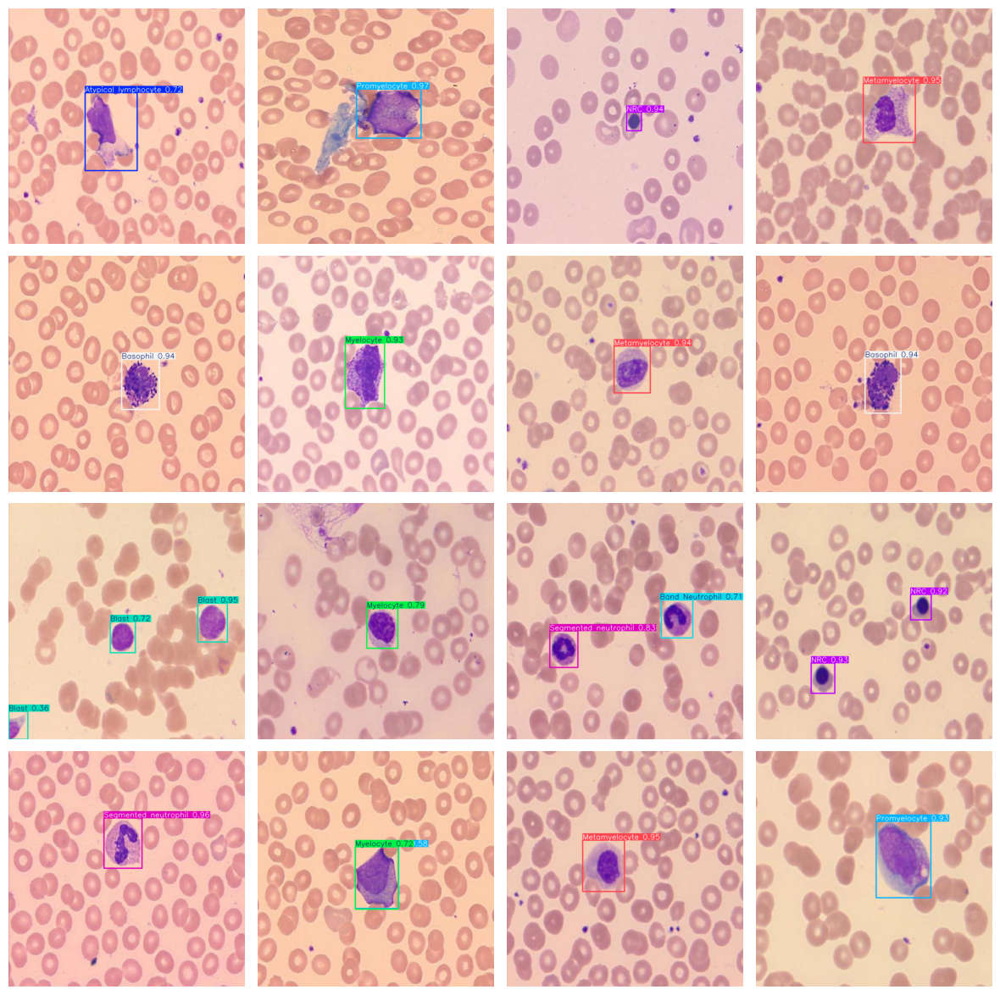

In [18]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [19]:

# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/detect/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.4,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00004_jpg.rf.33467f06547bca1934fbe5b5de747cf6.jpg: 640x640 1 Basophil, 17.4ms
image 2/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00006_jpg.rf.28e543e681b9d7532c911330ca0227b1.jpg: 640x640 1 Basophil, 17.5ms
image 3/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00010_jpg.rf.a8602ac6d9d1bff63810a82ee50fb04c.jpg: 640x640 1 Basophil, 17.5ms
image 4/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00016_jpg.rf.4ad41e92e2133917baccddeed12fc2f7.jpg: 640x640 1 Basophil, 17.4ms
image 5/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00026_jpg.rf.2a2c868b960df62918cbabd6cfcc5c24.jpg: 640x640 1 Basophil, 17.5ms
image 6/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00031_jpg.rf.9cadd0cc75ee9d59ea73a974e92e60f8.jpg: 640x640 1 Basophil, 17.4ms
image 7/667 /ka

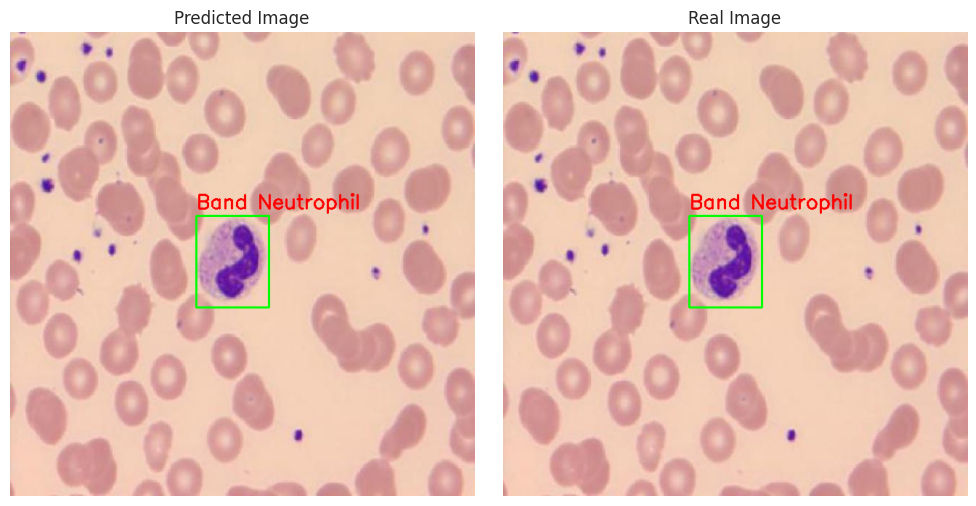

In [20]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


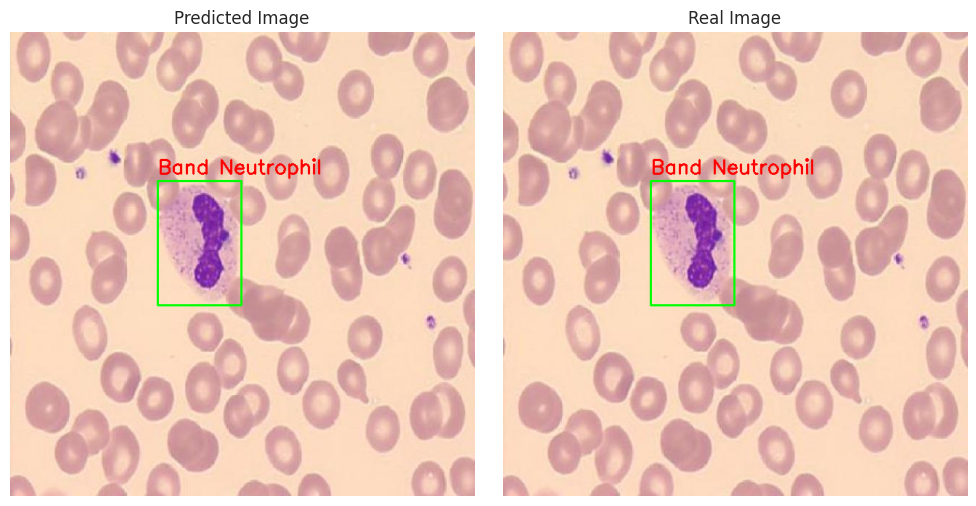

In [21]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


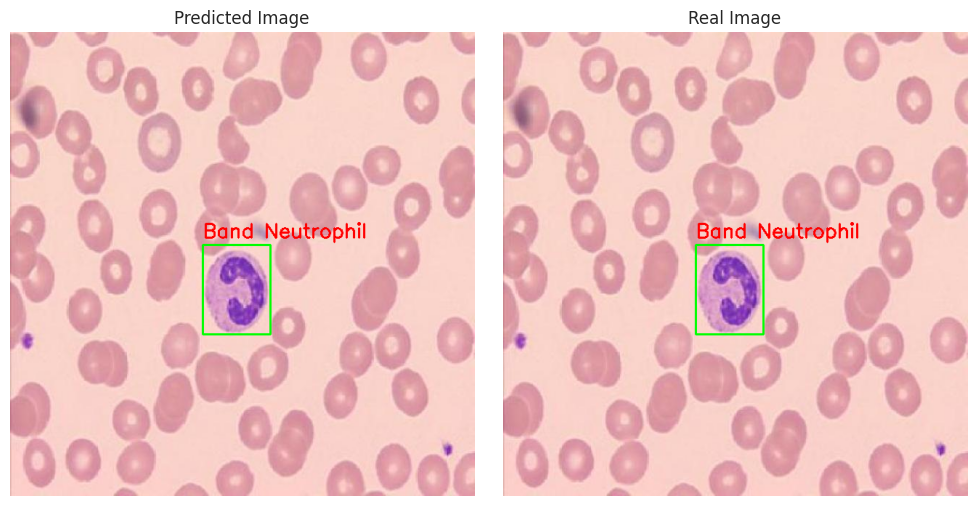

In [22]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


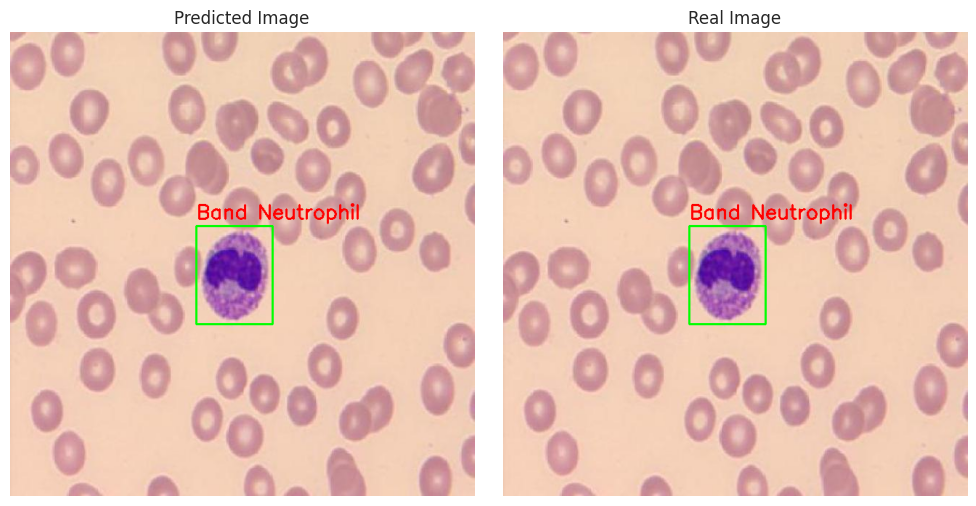

In [23]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


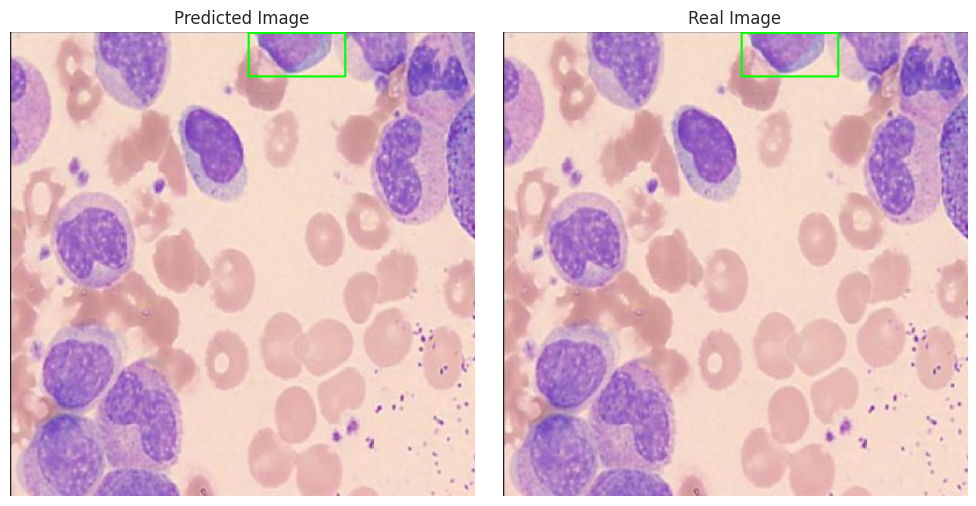

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


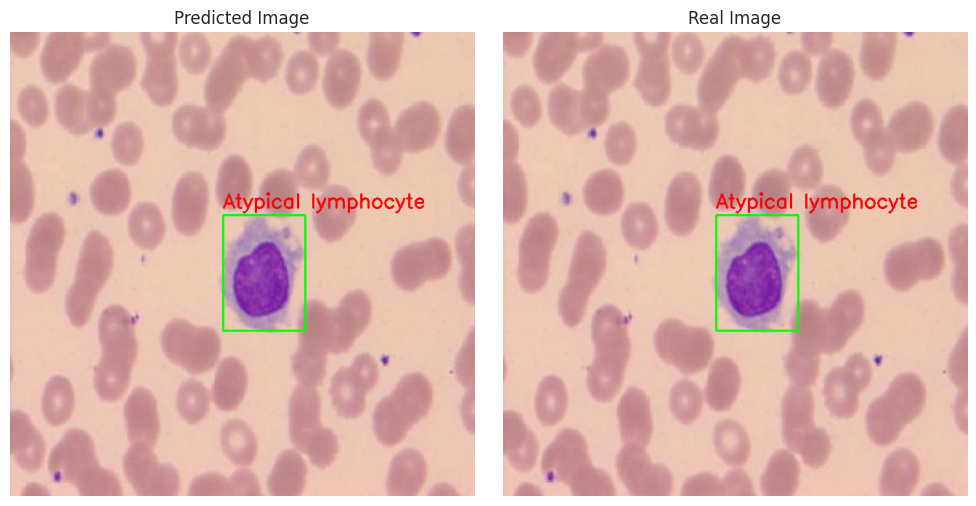

In [25]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


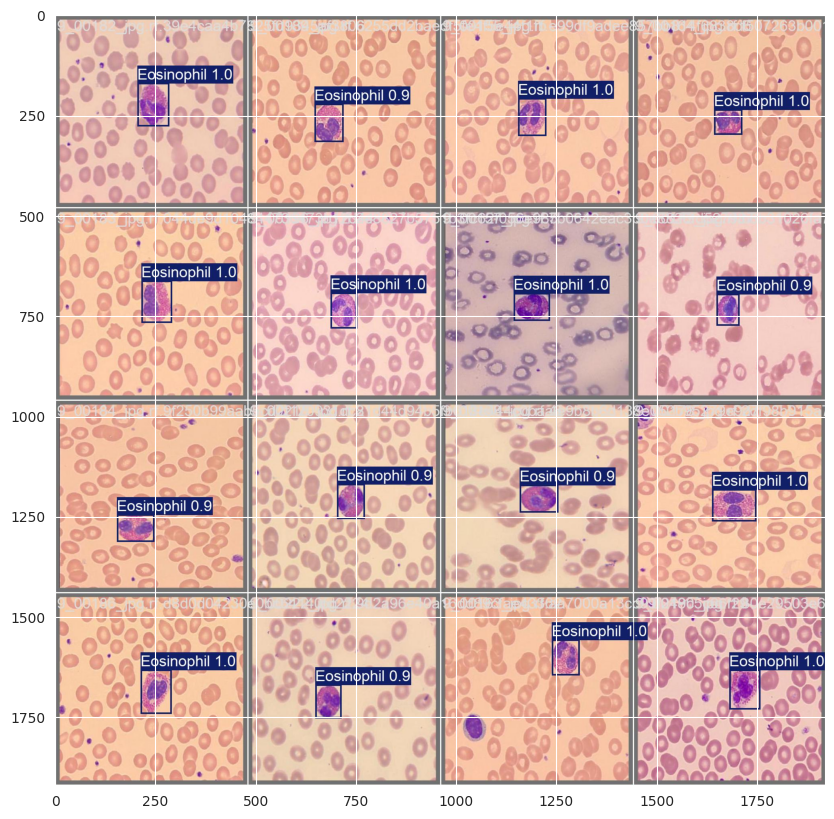

In [26]:
from PIL import Image  # Importing the Image module from PIL
import matplotlib.pyplot as plt
image_path = '/kaggle/working/runs/detect/train/val_batch0_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()

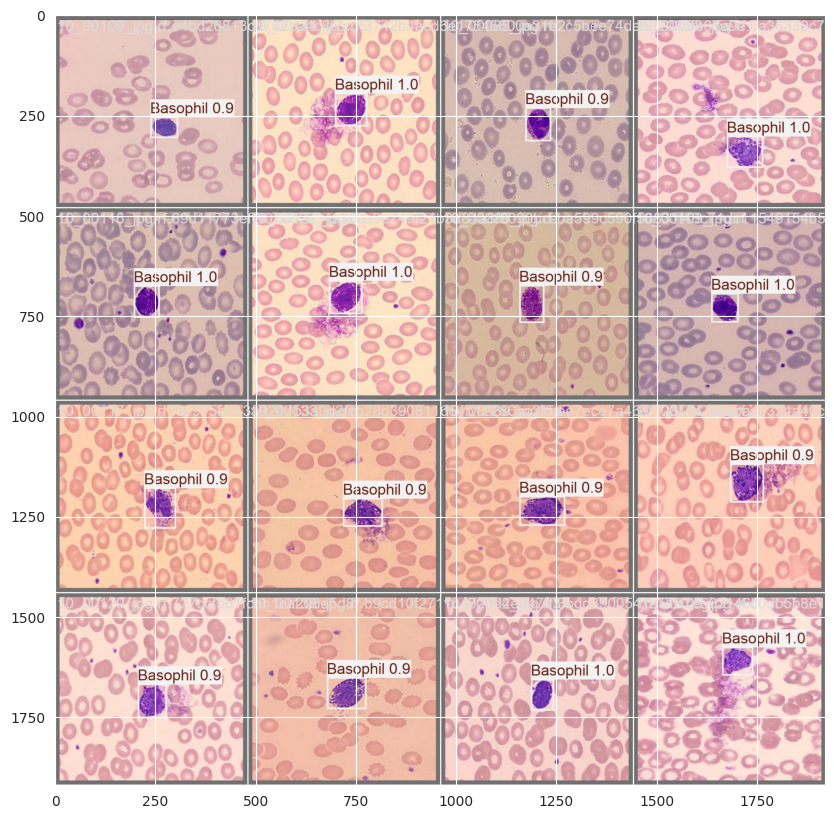

In [27]:
image_path = '/kaggle/working/runs/detect/train/val_batch1_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()